In [0]:
!pip install lime

     |████████████████████████████████| 276kB 8.1MB/s 
     |████████████████████████████████| 2.0MB 14.5MB/s 
  Created wheel for lime: filename=lime-0.2.0.0-cp36-none-any.whl size=284181 sha256=5fd88f20ac1e4f723383246b14915d5d14ef4d11ea50e4abb943a6a053952078
  Stored in directory: /root/.cache/pip/wheels/22/f2/ec/e5ebd07348b2b1ac722e91c2f549fcc220f7d5f25497a61232
Successfully built lime
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [0]:
!pip install shap

     |████████████████████████████████| 276kB 9.1MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394111 sha256=c2edd5bc6f278d3c6acc69d1d78110165719f6d5f91f26bedd99ff8891b2b956
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


# **Data Exploration and preprocessing**

Data used review of Indonesian Application in google playstore for classification dataset


The data consist of consumer review with 1-5 star, but we only use the data with 1 and 5 star which are labeled as negative and positive


In [0]:
import glob
import re
import pickle
import string

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.tokenize import word_tokenize

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
files = glob.glob('*')

In [0]:
train = pickle.load(open(files[0], 'rb'))
test = pickle.load(open(files[1], 'rb'))

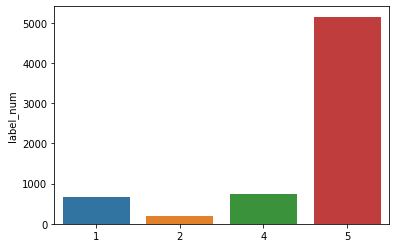

In [0]:
d_train = pd.DataFrame(data={'content': train[0], 'label': train[1]})
d_test = pd.DataFrame(data={'content': test[0], 'label': test[1]})


d_train['label_num'] = d_train.label.apply(lambda x: int(re.sub('Rated | stars out of five stars', '', x)))

d_train = d_train[d_train['label_num'] != 3]

d_test['label_num'] = d_test.label.apply(lambda x: int(re.sub('Rated | stars out of five stars', '', x)))

d_test = d_test[d_test['label_num'] != 3]

plot = sns.barplot(y = d_train.label_num.value_counts(), x = d_train.label_num.value_counts().index)

plot = sns.barplot(y = d_test.label_num.value_counts(), x = d_test.label_num.value_counts().index)

In [0]:
print(d_train.head())

                                             content  ... label_num
0   Halo\n blibli. Sedikit saran untuk gratis ong...  ...         4
1                      So far so good. Respon cepat.  ...         5
3   Aplikasi sering not responding di hp saya (as...  ...         2
4                                  Gak ada komentar.  ...         5
5                                    Sangat bagussss  ...         5

[5 rows x 3 columns]


In [0]:
d_train.loc[d_train.label_num > 3, 'sentiment'] = 1
d_train.loc[d_train.label_num < 3, 'sentiment'] = 0

d_test.loc[d_test.label_num > 3, 'sentiment'] = 1
d_test.loc[d_test.label_num < 3, 'sentiment'] = 0

In [0]:
print(d_train.head())

                                             content  ... sentiment
0   Halo\n blibli. Sedikit saran untuk gratis ong...  ...       1.0
1                      So far so good. Respon cepat.  ...       1.0
3   Aplikasi sering not responding di hp saya (as...  ...       0.0
4                                  Gak ada komentar.  ...       1.0
5                                    Sangat bagussss  ...       1.0

[5 rows x 4 columns]


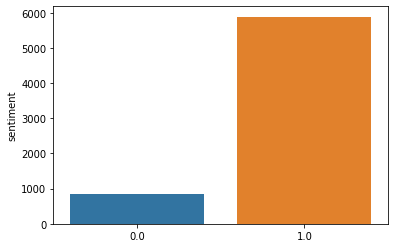

In [0]:
plot = sns.barplot(y = d_train.sentiment.value_counts(), x = d_train.sentiment.value_counts().index)

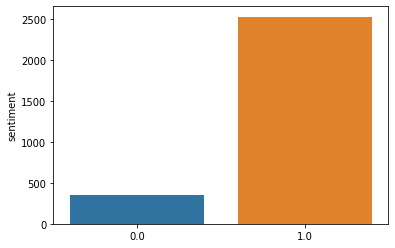

In [0]:
plot = sns.barplot(y = d_test.sentiment.value_counts(), x = d_test.sentiment.value_counts().index)

In [0]:
def remove_punctuation(word):
    for punkt in list(string.punctuation):
        word = word.replace(punkt, '')
        
    return word

In [0]:
def cleansing(text):
    text = text.lower()
    word_list = word_tokenize(text)
    word_list = [word for word in word_list if len(word) > 1]
    word_list = [remove_punctuation(word) for word in word_list]
    text = ' '.join(word_list)
    
    return text

In [0]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [0]:
d_train['content_cleansing'] = d_train.content.apply(cleansing)

d_test['content_cleansing'] = d_test.content.apply(cleansing)

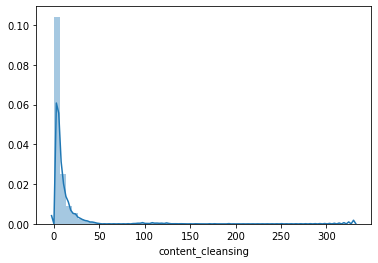

In [0]:
dist_plot = sns.distplot(d_train.content_cleansing.apply(lambda x: len(word_tokenize(x))))

In [0]:
d_train['cont_clean_len_token'] = d_train.content_cleansing.apply(lambda x: len(word_tokenize(x)))

In [0]:
d_test['cont_clean_len_token'] = d_test.content_cleansing.apply(lambda x: len(word_tokenize(x)))

In [0]:
d_train.drop(d_train[d_train['cont_clean_len_token'] == 0].index, axis = 0, inplace=True)

In [0]:
d_test.drop(d_test[d_test['cont_clean_len_token'] == 0].index, axis = 0, inplace = True)

In [0]:
d_train.reset_index(drop=True, inplace=True)
d_test.reset_index(drop=True, inplace=True)

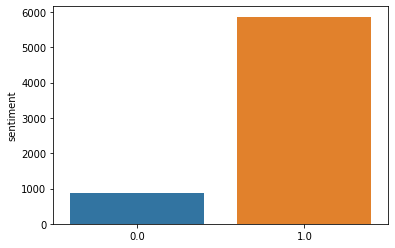

In [0]:
sns.barplot(y = d_train.sentiment.value_counts(), x = d_train.sentiment.value_counts().index)

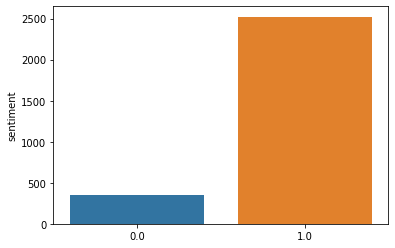

In [0]:
sns.barplot(y = d_test.sentiment.value_counts(), x = d_test.sentiment.value_counts().index)

In [0]:
text = " ".join(d_train.content_cleansing)

In [0]:
print(d_train.head())

                                             content  ... cont_clean_len_token
0   Halo\n blibli. Sedikit saran untuk gratis ong...  ...                   44
1                      So far so good. Respon cepat.  ...                    6
2   Aplikasi sering not responding di hp saya (as...  ...                   10
3                                  Gak ada komentar.  ...                    3
4                                    Sangat bagussss  ...                    2

[5 rows x 6 columns]


In [0]:
# split the dataset into training and validation datasets 
texts_train = d_train['content'].values
texts_test = d_test['content'].values
y_train = d_train['sentiment'].values
y_test =  d_test['sentiment'].values




In [0]:
print(d_test.head())

                                             content  ... cont_clean_len_token
0                                           bagussss  ...                    1
1            Pengiriman gratis dan produk bervariasi  ...                    5
2            Praktis dan mudah aplikasinya digunakan  ...                    5
3                                         No comment  ...                    2
4   Aplikasi Belanja Online terbaik di Indonesia ...  ...                    8

[5 rows x 6 columns]


In [0]:
d_train.shape

(6727, 6)

In [0]:
d_test.shape

(2877, 6)

## **Classification Model**

# **Bi-LSTM MODEL**

In [0]:
from sklearn.base import BaseEstimator, TransformerMixin
from keras.models import Model, Input
from keras.layers import Dense, LSTM, Dropout, Embedding, SpatialDropout1D, Bidirectional, concatenate, Flatten
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.utils.vis_utils import plot_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
import regex as re
import numpy as np
class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        bilstm = Bidirectional(LSTM(units=32, return_sequences=True, recurrent_dropout=0.5))(text_embedding)
        # x = concatenate([GlobalAveragePooling1D()(bilstm), GlobalMaxPooling1D()(bilstm)])
        flatten_layer = Flatten()
        x= flatten_layer(bilstm)
        x = Dense(512, activation="relu")(x)
        x = Dropout(0.5)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()
text_model = KerasTextClassifier(epochs=2, max_words=20000, input_length=200)

Using TensorFlow backend.


In [0]:
text_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 200)               0         
_________________________________________________________________
embedding_1 (Embedding)      (None, 200, 20)           400040    
_________________________________________________________________
spatial_dropout1d_1 (Spatial (None, 200, 20)           0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 200, 64)           13568     
_________________________________________________________________
flatten_1 (Flatten)          (None, 12800)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               6554112   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0   

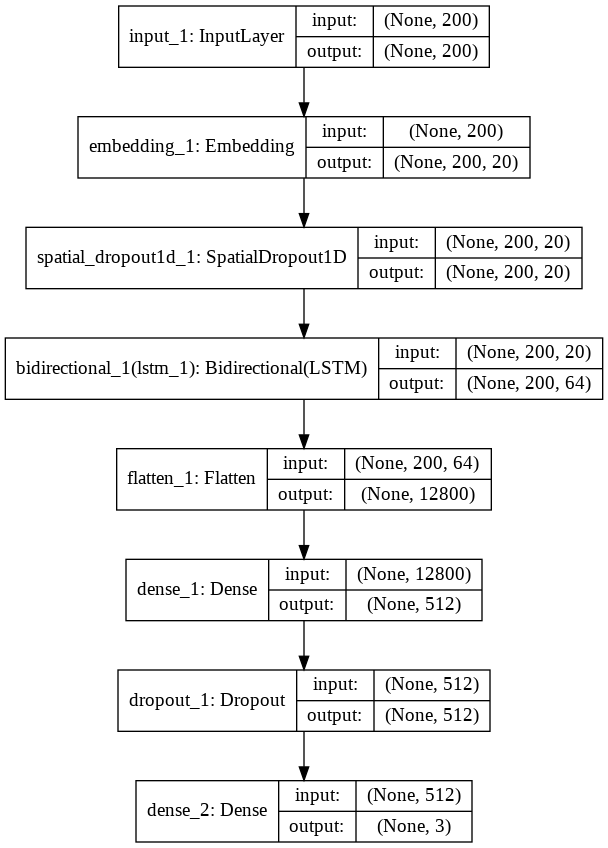

In [0]:
from IPython.display import Image
Image(filename='model_plot.png') 

In [0]:
history = text_model.fit(texts_train, y_train)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/indexed_slices.py:434: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Train on 6054 samples, validate on 673 samples
Epoch 1/2
6054/6054 [==============================] - 53s 9ms/step - loss: 0.2959 - accuracy: 0.8926 - val_loss: 0.1812 - val_accuracy: 0.9287
Epoch 2/2
6054/6054 [==============================] - 52s 9ms/step - loss: 0.1532 - accuracy: 0.9432 - val_loss: 0.1693 - val_accuracy: 0.9391


In [0]:
text_model.score(texts_test, y_test)

0.9374348279457768

## **Explaining with SHAP Explaination (kernel Explaination)**


In [0]:
encoded_x_train = text_model.trasnform(texts_train)
encoded_x_test = text_model.trasnform(texts_test)

In [0]:
def prepare_explanation_words(pipeline, encoded_x):
    words = pipeline.tokenizer.word_index
    num2word = {}
    for w in words.keys():
        num2word[words[w]] = w
    x_test_words = np.stack([
        np.array(list(map(
            lambda x: num2word.get(x, "NONE"), encoded_x[i])
                     )) for i in range(10)])

    return x_test_words

In [0]:
import shap
shap.initjs()
kernel_explainer = shap.KernelExplainer(text_model.model.predict, encoded_x_train[:20])
kernel_shap_values = kernel_explainer.shap_values(encoded_x_test[:20])

x_test_words = prepare_explanation_words(text_model, encoded_x_test)
y_pred = text_model.predict(texts_test[:20])

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


In [0]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[6], y_pred[6]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][6], x_test_words[6])

Actual Category: 1.0, Predict Category: 1


In [0]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[9], y_pred[9]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 0.0, Predict Category: 1


In [0]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[8], y_pred[8]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1.0, Predict Category: 1


### **Explain the Visualization** 


*   According to [paper](http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions.pdf) , the base value of 0.157 is the mean of prediction of all y_test. That is why, the value is not differ from all of three examples.
*   Red or Blue Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

*   Similar to LIME, SHAP also has large attributes on "lumayan" , "promo", and etc

*   This force plot of Kernel Explanation explains how different features pushed and pulled on the output to move it from the base_value to the model output value or prediction. The prediction of this kernel explanation is the probability or confidence that the review is 100% belong to predicted category  ("Negative" Class).

*   Above, the word "lumayan", "promo", "membantu", etc, on the right-hand side pushing the prediction from the base value 0.157 close to 0. Zero here means that the explainer predict 0% that this review belong to the Negative class



##  **Explaining with Lime**

Sample 6: last 80 words (only part used by the model)
--------------------------------------------------
Mudah digunakan
--------------------------------------------------
Probability(positive) = 0.9999162
True class:  1.0


split() requires a non-empty pattern match.


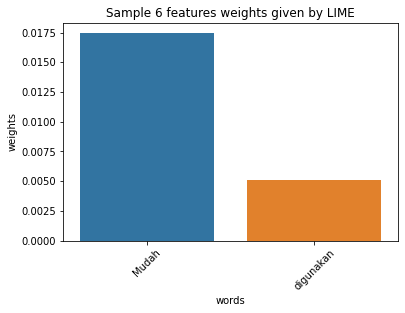

In [0]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx =6
idx2 =9
idx3=8
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['Negative', 'Positive']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [0]:
explanation.show_in_notebook(text=True)

Sample 9: last 80 words (only part used by the model)
--------------------------------------------------
Mudah digunakan
--------------------------------------------------
Probability(positive) = 0.9999162
True class:  0.0


split() requires a non-empty pattern match.


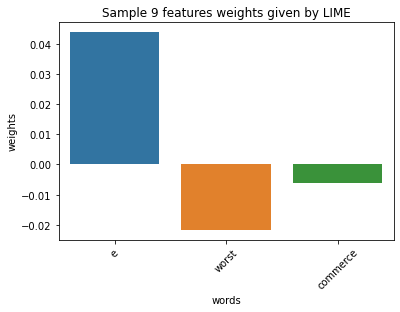

In [0]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx2))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx2])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample2, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx2));

In [0]:
explanation.show_in_notebook(text=True)

Sample 8: last 80 words (only part used by the model)
--------------------------------------------------
Mudah digunakan
--------------------------------------------------
Probability(positive) = 0.9999162
True class:  1.0


split() requires a non-empty pattern match.


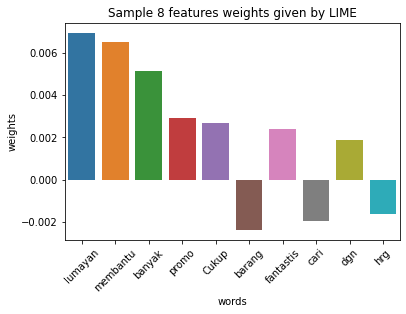

In [0]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx3))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx3])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample3, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx3));

In [0]:
explanation.show_in_notebook(text=True)

### **Explain the Visualization** 


*   On the "Text with higligted words", the blue words made the classifier think that the review was more negative while the yellow words made the review seem more positive.
*   For this review, word “lumayan” , "membantu" have the highest positive score. We are able to see it clearly that those words on its own is a positif signal. And there are no negative word that gave the significant impact on the prediction.

*   The explainer predicts that this review should be labeled as "positive" with the probability of 100%.




With LIME methods of explanation, it is easy for Human to intrepret and understand the prediction. LIME allows us to extract some important word that mostly contribute to the prediction, and even give the rational number "Negative" or "Positive" contribution of each word of sample.

# **MODEL Bi-GRU-LSTM-CNN**

In [0]:
from keras.layers import concatenate, Conv1D, GRU
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D

from keras import backend as K 

K.clear_session()

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        x = Bidirectional(GRU(units=32, return_sequences = True))(text_embedding)
        x = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(x)

        y = Bidirectional(LSTM(units=32, return_sequences=True))(text_embedding)
        y = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(y)
        

        avg_pool1 = GlobalAveragePooling1D()(x)
        max_pool1 = GlobalMaxPooling1D()(x)
    
        avg_pool2 = GlobalAveragePooling1D()(y)
        max_pool2 = GlobalMaxPooling1D()(y)

        x = concatenate([avg_pool1, max_pool1, avg_pool2, max_pool2])

        x = Dense(512, activation="relu")(x)
        x = Dropout(0.5)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot2.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()

text_model = KerasTextClassifier(epochs=2, max_words=20000, input_length=200)

In [0]:
text_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 200)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 200, 20)      400040      input_1[0][0]                    
__________________________________________________________________________________________________
spatial_dropout1d_1 (SpatialDro (None, 200, 20)      0           embedding_1[0][0]                
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 200, 64)      10176       spatial_dropout1d_1[0][0]        
____________________________________________________________________________________________

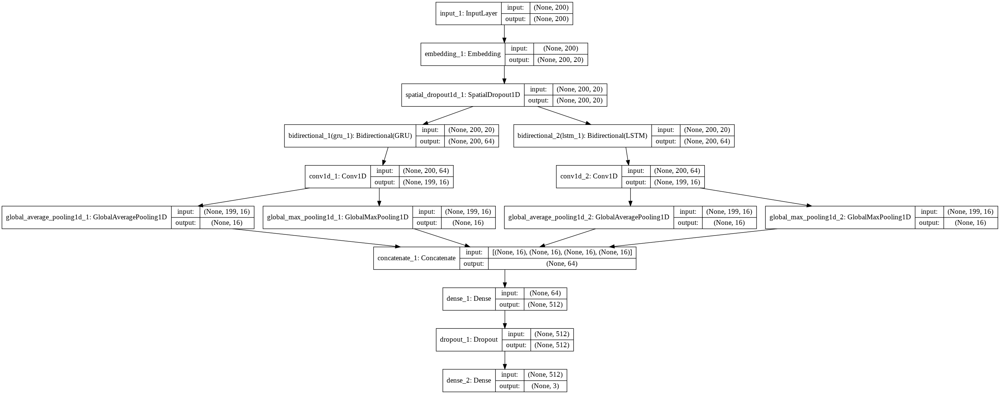

In [0]:
from IPython.display import Image
Image(filename='model_plot2.png') 

In [0]:
history = text_model.fit(texts_train, y_train)

Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.


Train on 6054 samples, validate on 673 samples
Epoch 1/2
6054/6054 [==============================] - 81s 13ms/step - loss: 0.3445 - accuracy: 0.8794 - val_loss: 0.1865 - val_accuracy: 0.9242
Epoch 2/2
6054/6054 [==============================] - 79s 13ms/step - loss: 0.1566 - accuracy: 0.9384 - val_loss: 0.1568 - val_accuracy: 0.9450


In [0]:
text_model.score(texts_test, y_test)

0.9454292665971498

## **Explaining with SHAP Explaination (kernel Explaination)**


In [0]:
encoded_x_train = text_model.trasnform(texts_train)
encoded_x_test = text_model.trasnform(texts_test)

In [0]:
def prepare_explanation_words(pipeline, encoded_x):
    words = pipeline.tokenizer.word_index
    num2word = {}
    for w in words.keys():
        num2word[words[w]] = w
    x_test_words = np.stack([
        np.array(list(map(
            lambda x: num2word.get(x, "NONE"), encoded_x[i])
                     )) for i in range(10)])

    return x_test_words

In [0]:
import shap
shap.initjs()
kernel_explainer = shap.KernelExplainer(text_model.model.predict, encoded_x_train[:10])
kernel_shap_values = kernel_explainer.shap_values(encoded_x_test[:10])

x_test_words = prepare_explanation_words(text_model, encoded_x_test)
y_pred = text_model.predict(texts_test[:10])

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


In [0]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[6], y_pred[6]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][6], x_test_words[6])

Actual Category: 1.0, Predict Category: 1


In [0]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[9], y_pred[9]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 0.0, Predict Category: 1


In [0]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[8], y_pred[8]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1.0, Predict Category: 1


### **Explain the Visualization** 

*   Similar to LIME, SHAP also has large attributes on "lumayan" , "promo", and etc

*   This force plot of Kernel Explanation explains how different features pushed and pulled on the output to move it from the base_value to the model output value or prediction. The prediction of this kernel explanation is the probability or confidence that the review is 100% belong to predicted category  ("Negative" Class).

*   Above, the word "lumayan", "promo", "membantu", etc, on the right-hand side pushing the prediction from the base value 0.1246 close to 0.02. Zero here means that the explainer predict 2% that this review belong to the Negative class

##**Explaining with Lime**

Sample 6: last 80 words (only part used by the model)
--------------------------------------------------
Mudah digunakan
--------------------------------------------------
Probability(positive) = 0.999912
True class:  1.0


split() requires a non-empty pattern match.


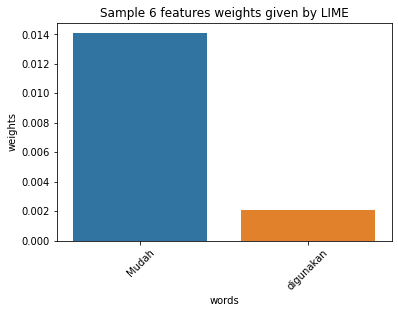

In [0]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx =6
idx2 =9
idx3=8
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['Negative', 'Positive']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [0]:
explanation.show_in_notebook(text=True)

Sample 9: last 80 words (only part used by the model)
--------------------------------------------------
Mudah digunakan
--------------------------------------------------
Probability(positive) = 0.999912
True class:  0.0


split() requires a non-empty pattern match.


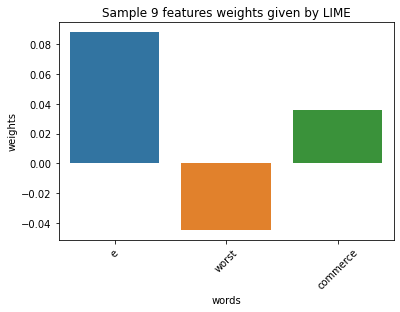

In [0]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx2))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx2])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample2, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx2));

In [0]:
explanation.show_in_notebook(text=True)

Sample 8: last 80 words (only part used by the model)
--------------------------------------------------
Mudah digunakan
--------------------------------------------------
Probability(positive) = 0.999912
True class:  1.0


split() requires a non-empty pattern match.


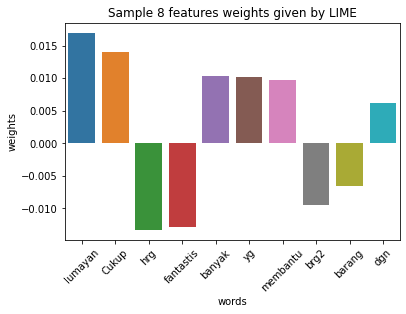

In [0]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx3))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx3])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample3, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx3));

In [0]:
explanation.show_in_notebook(text=True)

### **Explain the Visualization** 


*   On the "Text with higligted words", the blue words made the classifier think that the review was more negative while the yellow words made the review seem more positive.
*   For this review, word “lumayan” , "cukup" have the highest positive score. It is different from the previous model, word "membantu" does not have significant impact score. We are able to see it clearly that those words on its own is a positif signal. And there are no negative word that gave the significant impact on the prediction.

*   The explainer predicts that this review should be labeled as "positive" with the probability of 98%.




With LIME methods of explanation, it is easy for Human to intrepret and understand the prediction. LIME allows us to extract some important word that mostly contribute to the prediction, and even give the rational number "Negative" or "Positive" contribution of each word of sample.